In [1]:
import os
import numpy as np
import cv2
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
import albumentations as A
import matplotlib.pyplot as plt

# ====================
# CONFIGURATION
# ====================
BASE_PATH = r"C:\Users\Shafi.09\AnocondaProjects\BrainT\R_datasets"
PREPROCESSED_PATH = os.path.join(BASE_PATH, "preprocessed_masoud_nickparvar_dataset")
LABELS = ['glioma', 'meningioma', 'pituitary', 'notumor']
IMAGE_SIZE = 150
VAL_SPLIT = 0.2  # 20% of training data for validation
RANDOM_STATE = 42

# ====================
# DATA LOADING & PREPROCESSING
# ====================
def mri_preprocessing(image):
    """Enhanced MRI-specific preprocessing"""
    # Convert to grayscale if needed (handles both color and grayscale inputs)
    if len(image.shape) == 3:
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    else:
        gray = image
    
    # Contrast enhancement
    clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8, 8))
    enhanced = clahe.apply(gray)
    
    # Noise reduction
    blurred = cv2.medianBlur(enhanced, 3)
    
    # Resize and normalize
    processed = cv2.resize(blurred, (IMAGE_SIZE, IMAGE_SIZE))
    return np.expand_dims(processed/255.0, axis=-1)  # Add channel dimension

def load_data(directory):
    X, Y = [], []
    for label in LABELS:
        folder_path = os.path.join(directory, label)
        for img_name in os.listdir(folder_path):
            img_path = os.path.join(folder_path, img_name)
            img = cv2.imread(img_path, cv2.IMREAD_ANYCOLOR)
            if img is not None:
                processed = mri_preprocessing(img)
                X.append(processed)
                Y.append(label)
    return np.array(X), np.array(Y)

# Load ALL training data (will be split later)
print("Loading training data...")
X_train_all, Y_train_all = load_data(os.path.join(PREPROCESSED_PATH, "Training"))

# Load test data (untouched)
print("Loading test data...")
X_test, Y_test = load_data(os.path.join(PREPROCESSED_PATH, "Testing"))

# Split training data into train and validation sets
print(f"Splitting training data (validation: {VAL_SPLIT*100}%)...")
X_train, X_val, Y_train, Y_val = train_test_split(
    X_train_all, Y_train_all, 
    test_size=VAL_SPLIT, 
    stratify=Y_train_all,  # Maintain class distribution
    random_state=RANDOM_STATE
)

# Encode labels
def encode_labels(Y):
    return tf.keras.utils.to_categorical([LABELS.index(y) for y in Y], num_classes=len(LABELS))

Y_train = encode_labels(Y_train)
Y_val = encode_labels(Y_val)
Y_test = encode_labels(Y_test)

# Shuffle training data
X_train, Y_train = shuffle(X_train, Y_train, random_state=RANDOM_STATE)

Loading training data...
Loading test data...
Splitting training data (validation: 20.0%)...


In [2]:
# ====================
# DATA AUGMENTATION
# ====================
def augment_images(images: np.ndarray) -> np.ndarray:
    """Conservative MRI augmentation preserving diagnostic features"""
    transform = A.Compose([
        A.HorizontalFlip(p=0.5),
        A.VerticalFlip(p=0.5),
        A.Rotate(limit=15, p=0.7, border_mode=cv2.BORDER_CONSTANT),
    ])

    aug_images = []
    for img in images:
        augmented = transform(image=img[..., 0])['image']
        aug_images.append(augmented[..., np.newaxis])  # Maintain channel dim
    
    return np.array(aug_images)

print("\nAugmenting training data...")
X_train_aug = augment_images(X_train)
Y_train_aug = Y_train.copy()

# Combine and shuffle to create FINAL training set
X_train_final = np.concatenate([X_train, X_train_aug], axis=0)
Y_train_final = np.concatenate([Y_train, Y_train_aug], axis=0)
X_train_final, Y_train_final = shuffle(X_train_final, Y_train_final, random_state=RANDOM_STATE)

print(f"Original training samples: {len(X_train)}")
print(f"Augmented training samples: {len(X_train_aug)}")
print(f"Final training samples: {len(X_train_final)}")

# ====================
# DATASET ANALYSIS
# ====================
def print_class_distribution(Y, dataset_name):
    class_counts = np.sum(Y, axis=0)
    print(f"\n{dataset_name} class distribution:")
    for i, label in enumerate(LABELS):
        print(f"{label}: {class_counts[i]} samples")
    print(f"Total: {len(Y)} samples")

def print_shapes():
    print("\nDataset Shapes:")
    print(f"FINAL TRAINING SET: X_train_final: {X_train_final.shape}, Y_train_final: {Y_train_final.shape}")
    print(f"Validation set: X_val: {X_val.shape}, Y_val: {Y_val.shape}")
    print(f"Test set: X_test: {X_test.shape}, Y_test: {Y_test.shape}")

print_class_distribution(Y_train_final, "Final Training Set")
print_class_distribution(Y_val, "Validation Set")
print_class_distribution(Y_test, "Test Set")
print_shapes()


Augmenting training data...
Original training samples: 4416
Augmented training samples: 4416
Final training samples: 8832

Final Training Set class distribution:
glioma: 2114.0 samples
meningioma: 2132.0 samples
pituitary: 2312.0 samples
notumor: 2274.0 samples
Total: 8832 samples

Validation Set class distribution:
glioma: 264.0 samples
meningioma: 267.0 samples
pituitary: 289.0 samples
notumor: 285.0 samples
Total: 1105 samples

Test Set class distribution:
glioma: 299.0 samples
meningioma: 302.0 samples
pituitary: 295.0 samples
notumor: 309.0 samples
Total: 1205 samples

Dataset Shapes:
FINAL TRAINING SET: X_train_final: (8832, 150, 150, 1), Y_train_final: (8832, 4)
Validation set: X_val: (1105, 150, 150, 1), Y_val: (1105, 4)
Test set: X_test: (1205, 150, 150, 1), Y_test: (1205, 4)



DATASET DISTRIBUTION VISUALIZATION


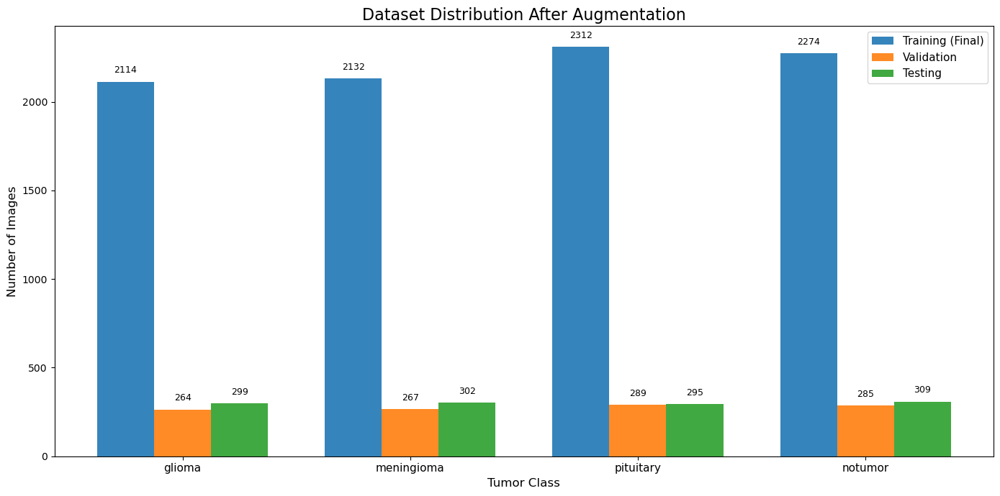


SAMPLE IMAGE VISUALIZATION
Final Training Set Samples:


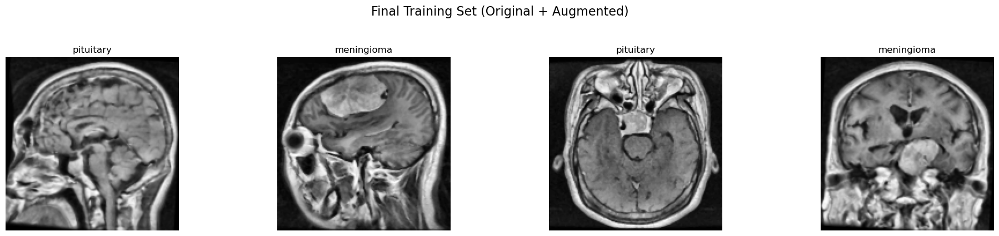


Validation Set Samples:


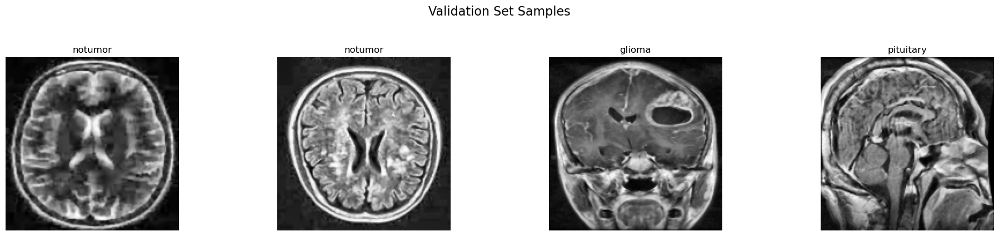


Test Set Samples:


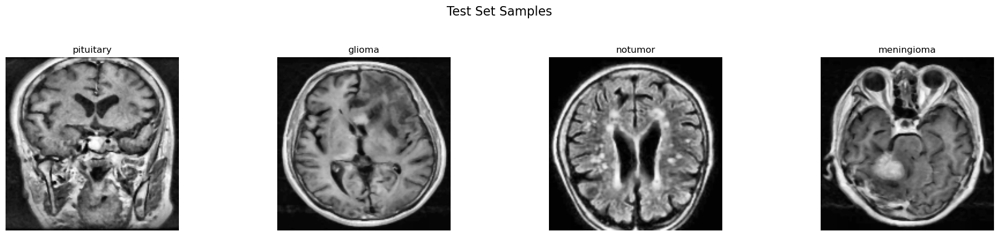


INTENSITY HISTOGRAM ANALYSIS
Training Set Intensity Distribution:


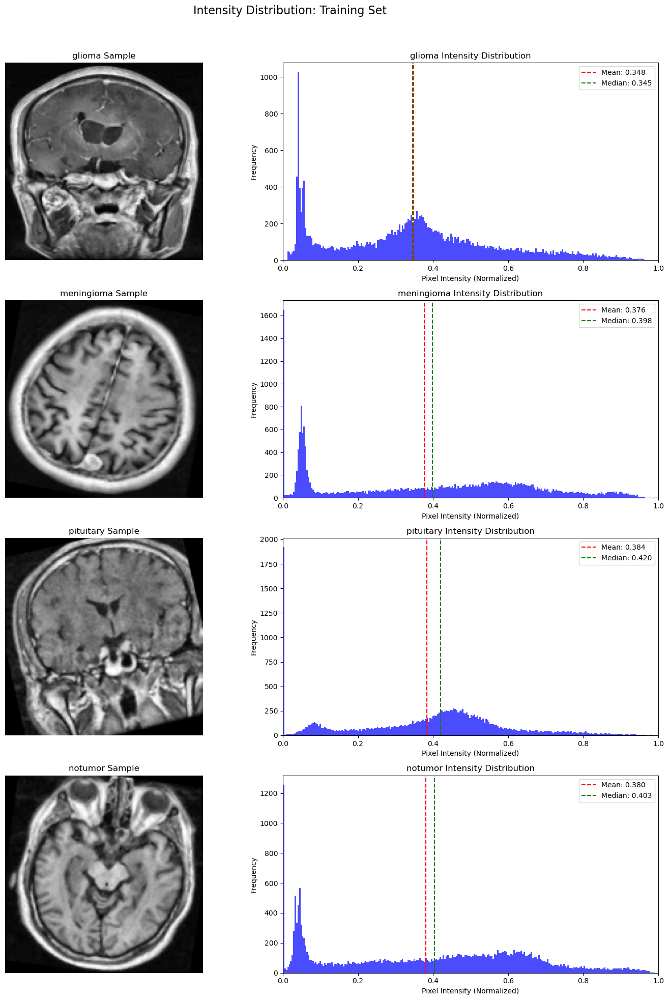


Validation Set Intensity Distribution:


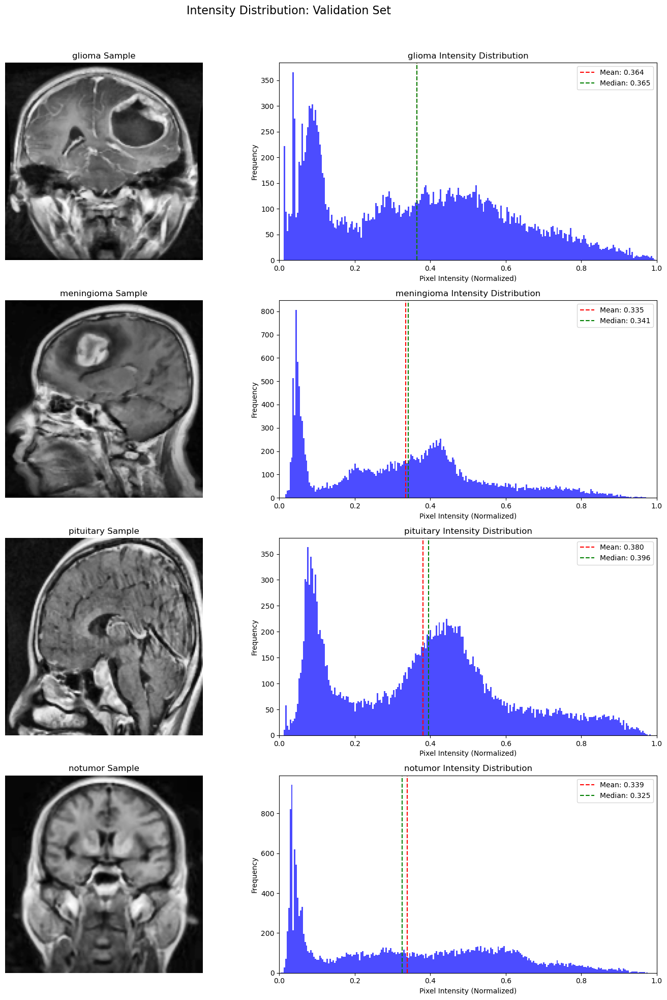


Test Set Intensity Distribution:


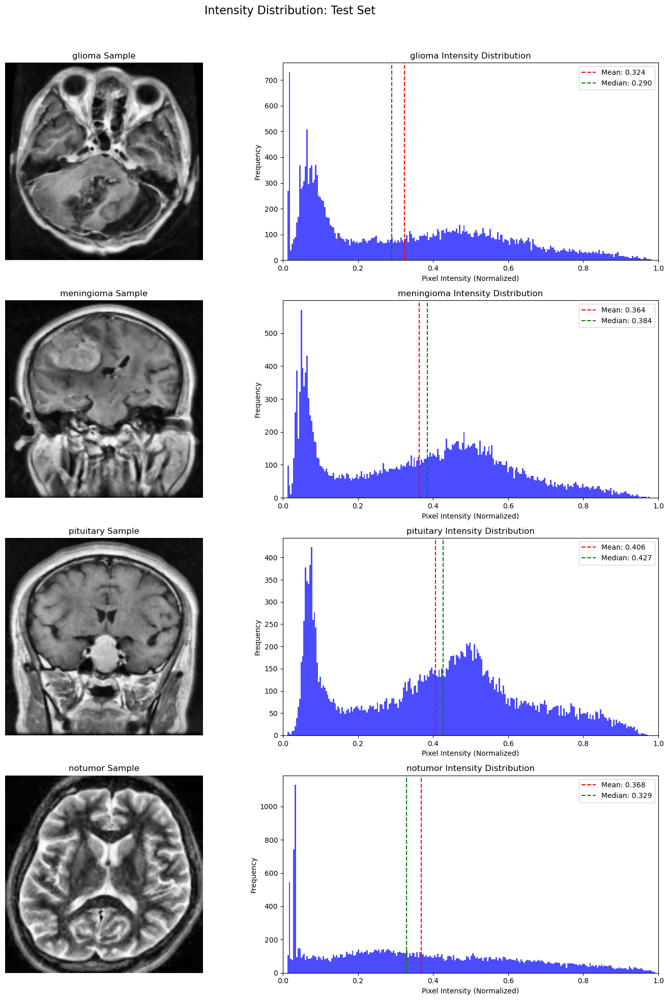


AUGMENTATION QUALITY CHECK


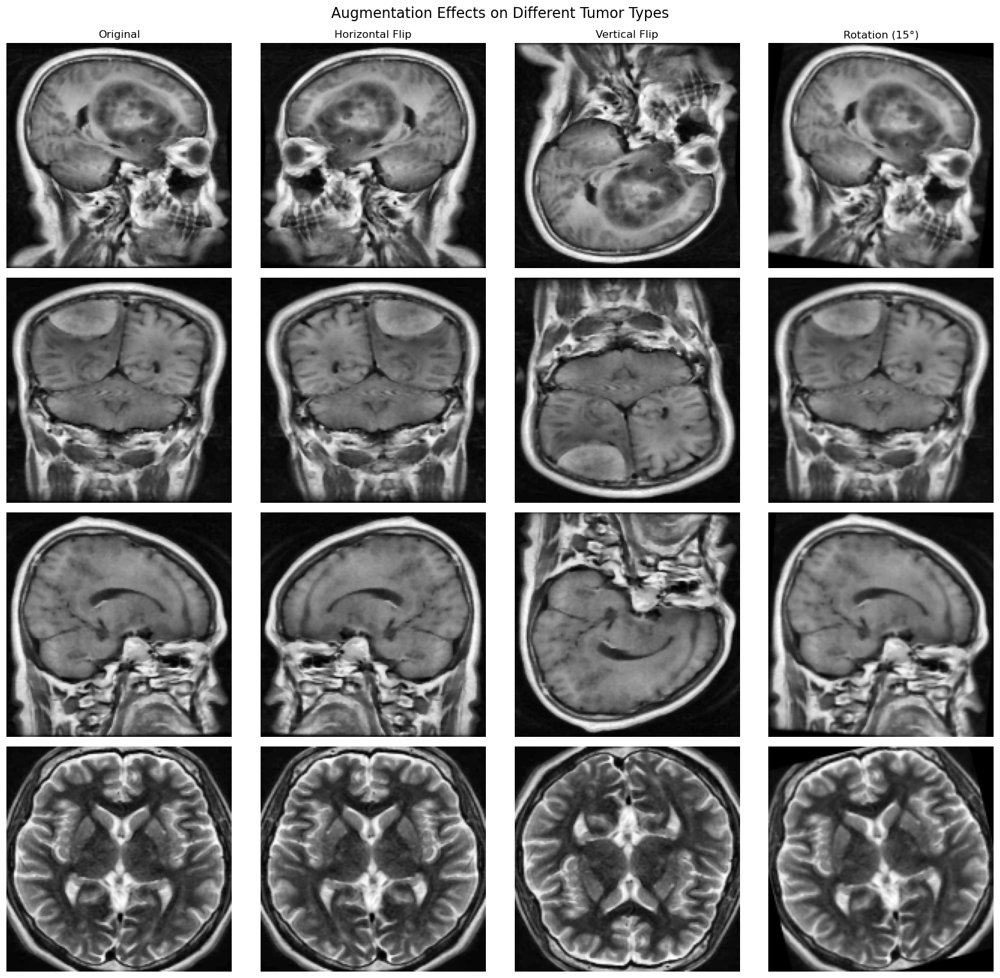

In [3]:
# ====================
# VISUALIZATION FUNCTIONS (FIXED & OPTIMIZED)
# ====================
def plot_samples(images, labels, title, num_samples=5):
    plt.figure(figsize=(15, 3))
    plt.suptitle(title, fontsize=16)
    indices = np.random.choice(range(len(images)), num_samples)
    
    for i, idx in enumerate(indices):
        plt.subplot(1, num_samples, i+1)
        plt.imshow(images[idx][..., 0], cmap='gray')
        class_idx = np.argmax(labels[idx])
        plt.title(f"{LABELS[class_idx]}")
        plt.axis('off')
    plt.tight_layout()
    plt.show()

def plot_dataset_distribution(Y_train_final, Y_val, Y_test):
    train_counts = np.sum(Y_train_final, axis=0)
    val_counts = np.sum(Y_val, axis=0)
    test_counts = np.sum(Y_test, axis=0)
    
    fig, ax = plt.subplots(figsize=(14, 7))
    width = 0.25
    x = np.arange(len(LABELS))
    
    ax.bar(x - width, train_counts, width, label="Training (Final)", alpha=0.9)
    ax.bar(x, val_counts, width, label="Validation", alpha=0.9)
    ax.bar(x + width, test_counts, width, label="Testing", alpha=0.9)
    
    ax.set_xlabel("Tumor Class", fontsize=12)
    ax.set_ylabel("Number of Images", fontsize=12)
    ax.set_title("Dataset Distribution After Augmentation", fontsize=16)
    ax.set_xticks(x)
    ax.set_xticklabels(LABELS, fontsize=11)
    ax.legend(fontsize=11)
    
    for i, v in enumerate(train_counts):
        ax.text(i - width, v + 50, str(int(v)), ha='center', fontsize=9)
    for i, v in enumerate(val_counts):
        ax.text(i, v + 50, str(int(v)), ha='center', fontsize=9)
    for i, v in enumerate(test_counts):
        ax.text(i + width, v + 50, str(int(v)), ha='center', fontsize=9)
    
    plt.tight_layout()
    plt.show()

def display_sample_images(images, labels, title, n=4):
    fig, axes = plt.subplots(1, n, figsize=(20, 4))
    fig.suptitle(title, fontsize=16, y=1.05)
    
    indices = np.random.choice(range(len(images)), n, replace=False)
    
    for i, idx in enumerate(indices):
        img = images[idx]
        if img.shape[-1] == 1:
            img = np.squeeze(img, axis=-1)
        axes[i].imshow(img, cmap='gray')
        class_idx = np.argmax(labels[idx])
        axes[i].set_title(f"{LABELS[class_idx]}", fontsize=12)
        axes[i].axis("off")
    
    plt.tight_layout()
    plt.show()

def plot_intensity_histograms(images, labels, title):
    # Create a 4x2 grid (4 tumor types, 2 plots per type)
    fig, axs = plt.subplots(4, 2, figsize=(15, 20))
    fig.suptitle(f"Intensity Distribution: {title}", fontsize=16, y=0.98)
    
    for class_idx, class_name in enumerate(LABELS):
        # Get random sample from this class
        class_indices = np.where(np.argmax(labels, axis=1) == class_idx)[0]
        img = images[np.random.choice(class_indices)]
        
        # Squeeze if single channel
        if img.shape[-1] == 1:
            img = np.squeeze(img, axis=-1)
        
        # Image plot
        ax_img = axs[class_idx, 0]
        ax_img.imshow(img, cmap='gray')
        ax_img.set_title(f"{class_name} Sample", fontsize=12)
        ax_img.axis('off')
        
        # Histogram plot
        ax_hist = axs[class_idx, 1]
        ax_hist.hist(img.ravel(), bins=256, range=(0, 1), alpha=0.7, color='blue')
        ax_hist.set_xlim(0, 1)
        ax_hist.set_title(f"{class_name} Intensity Distribution", fontsize=12)
        ax_hist.set_xlabel("Pixel Intensity (Normalized)")
        ax_hist.set_ylabel("Frequency")
        
        # Add statistical markers
        mean_val = np.mean(img)
        median_val = np.median(img)
        ax_hist.axvline(x=mean_val, color='red', linestyle='--', label=f'Mean: {mean_val:.3f}')
        ax_hist.axvline(x=median_val, color='green', linestyle='--', label=f'Median: {median_val:.3f}')
        ax_hist.legend(fontsize=10)
    
    plt.tight_layout(rect=[0, 0, 1, 0.96])  # Make room for suptitle
    plt.show()

def compare_augmentation_effects(images, labels):
    # Create 4x4 grid (4 tumor types, 4 augmentation types)
    fig, axes = plt.subplots(4, 4, figsize=(16, 16))
    fig.suptitle("Augmentation Effects on Different Tumor Types", fontsize=16, y=0.95)
    
    # Define augmentations to demonstrate
    augmentations = {
        "Original": A.NoOp(),
        "Horizontal Flip": A.HorizontalFlip(p=1),
        "Vertical Flip": A.VerticalFlip(p=1),
        "Rotation (15°)": A.Rotate(limit=15, p=1, border_mode=cv2.BORDER_CONSTANT)
    }
    
    # For each tumor class
    for row_idx, class_name in enumerate(LABELS):
        # Get a random sample of this class
        class_indices = np.where(np.argmax(labels, axis=1) == row_idx)[0]
        orig_img = images[np.random.choice(class_indices)]
        
        # Squeeze if single channel
        if orig_img.shape[-1] == 1:
            orig_img = np.squeeze(orig_img, axis=-1)
        
        # Apply each augmentation
        for col_idx, (aug_name, aug) in enumerate(augmentations.items()):
            augmented = aug(image=orig_img)['image']
            ax = axes[row_idx, col_idx]
            ax.imshow(augmented, cmap='gray')
            
            # Set row and column titles
            if row_idx == 0:
                ax.set_title(aug_name, fontsize=12)
            if col_idx == 0:
                ax.set_ylabel(class_name, fontsize=12)
                
            ax.axis('off')
    
    plt.tight_layout(rect=[0, 0, 1, 0.96])  # Make room for suptitle
    plt.show()

# ====================
# QUALITATIVE ANALYSIS (OPTIMIZED)
# ====================
print("\n" + "="*50)
print("DATASET DISTRIBUTION VISUALIZATION")
print("="*50)
plot_dataset_distribution(Y_train_final, Y_val, Y_test)

print("\n" + "="*50)
print("SAMPLE IMAGE VISUALIZATION")
print("="*50)
print("Final Training Set Samples:")
display_sample_images(X_train_final, Y_train_final, "Final Training Set (Original + Augmented)")

print("\nValidation Set Samples:")
display_sample_images(X_val, Y_val, "Validation Set Samples")

print("\nTest Set Samples:")
display_sample_images(X_test, Y_test, "Test Set Samples")

print("\n" + "="*50)
print("INTENSITY HISTOGRAM ANALYSIS")
print("="*50)
print("Training Set Intensity Distribution:")
plot_intensity_histograms(X_train_final, Y_train_final, "Training Set")

print("\nValidation Set Intensity Distribution:")
plot_intensity_histograms(X_val, Y_val, "Validation Set")

print("\nTest Set Intensity Distribution:")
plot_intensity_histograms(X_test, Y_test, "Test Set")

print("\n" + "="*50)
print("AUGMENTATION QUALITY CHECK")
print("="*50)
# Use original training images before augmentation
compare_augmentation_effects(X_train, Y_train)

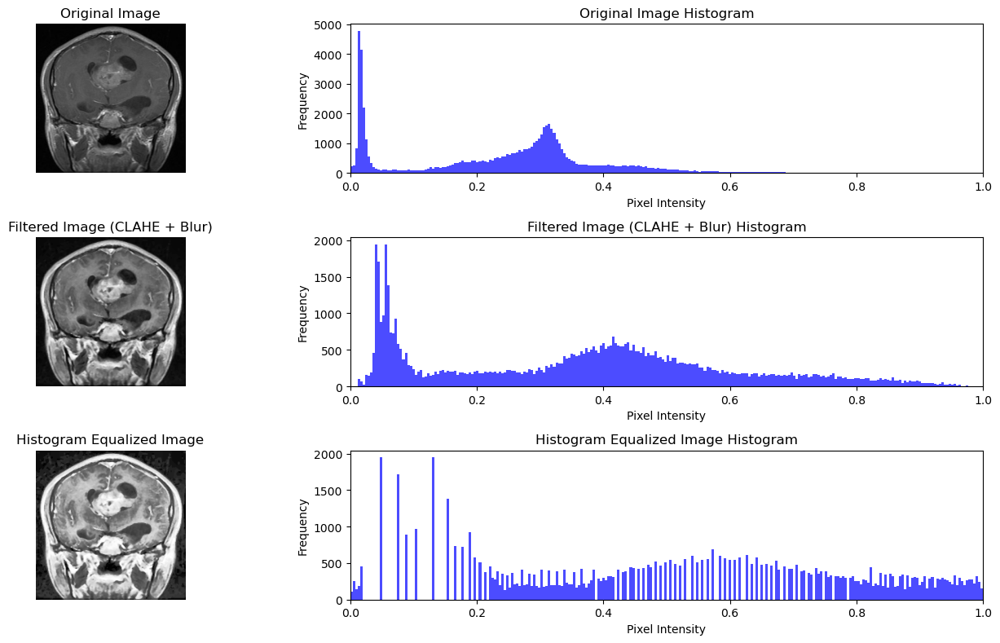

In [4]:
def plot_histogram_equalization_comparison(original_img):
    """
    Plot original, filtered (CLAHE + median blur), and histogram equalized images
    along with their histograms for visual comparison.
    Assumes input image is a BGR or grayscale NumPy array.
    """
    # Convert to grayscale if needed
    if len(original_img.shape) == 3:
        gray = cv2.cvtColor(original_img, cv2.COLOR_BGR2GRAY)
    else:
        gray = original_img

    # Step 1: Filtered image (CLAHE + median blur) - like your preprocessing
    clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8, 8))
    filtered = clahe.apply(gray)
    filtered = cv2.medianBlur(filtered, 3)

    # Step 2: Histogram equalization (use cv2.equalizeHist on filtered image)
    equalized = cv2.equalizeHist(filtered)

    # Normalize all images to [0,1] for plotting consistency
    orig_norm = gray / 255.0
    filtered_norm = filtered / 255.0
    equalized_norm = equalized / 255.0

    images = [orig_norm, filtered_norm, equalized_norm]
    titles = ['Original Image', 'Filtered Image (CLAHE + Blur)', 'Histogram Equalized Image']

    plt.figure(figsize=(15, 8))
    
    for i, (img, title) in enumerate(zip(images, titles)):
        # Image display
        plt.subplot(3, 2, 2*i + 1)
        plt.imshow(img, cmap='gray')
        plt.title(title)
        plt.axis('off')
        
        # Histogram display
        plt.subplot(3, 2, 2*i + 2)
        plt.hist(img.ravel(), bins=256, range=(0, 1), color='blue', alpha=0.7)
        plt.title(f"{title} Histogram")
        plt.xlabel('Pixel Intensity')
        plt.ylabel('Frequency')
        plt.xlim(0, 1)
    
    plt.tight_layout()
    plt.show()

# Example usage:
# Pick a random sample from your original dataset folder (before preprocessing)
sample_path = os.path.join(PREPROCESSED_PATH, 'Training', 'glioma', os.listdir(os.path.join(PREPROCESSED_PATH, 'Training', 'glioma'))[1])
sample_img = cv2.imread(sample_path, cv2.IMREAD_ANYCOLOR)
plot_histogram_equalization_comparison(sample_img)


In [5]:
from tensorflow import keras
from tensorflow.keras import regularizers
import tensorflow as tf
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping
from tensorflow.keras.optimizers import Adam
import tensorflow.keras.backend as K
import numpy as np
import matplotlib.pyplot as plt
from sklearn.utils.class_weight import compute_class_weight

# ====================
# MODEL ARCHITECTURE
# ====================
def create_model(input_shape=(150, 150, 1)):
    model = keras.models.Sequential([
        # First Convolutional Block
        keras.layers.Conv2D(filters=32, kernel_size=(3, 3), input_shape=input_shape, activation='relu', 
                            kernel_regularizer=regularizers.l2(0.01), name='Conv1'),
        keras.layers.BatchNormalization(name='BatchNormalization1'),
        keras.layers.MaxPool2D(pool_size=(2, 2), strides=(2, 2), name='MaxPooling1'),
        
        # Second Convolutional Block
        keras.layers.Conv2D(filters=64, kernel_size=(3, 3), activation='relu', 
                            kernel_regularizer=regularizers.l2(0.01), name='Conv2'),
        keras.layers.BatchNormalization(name='BatchNormalization2'),
        keras.layers.MaxPool2D(pool_size=(2, 2), strides=(2, 2), name='MaxPooling2'),
        
        # Third Convolutional Block
        keras.layers.Conv2D(filters=128, kernel_size=(3, 3), activation='relu', 
                            kernel_regularizer=regularizers.l2(0.01), name='Conv3'),
        keras.layers.BatchNormalization(name='BatchNormalization3'),
        keras.layers.MaxPool2D(pool_size=(2, 2), strides=(2, 2), name='MaxPooling3'),
        
        # Fourth Convolutional Block
        keras.layers.Conv2D(filters=256, kernel_size=(3, 3), activation='relu', 
                            kernel_regularizer=regularizers.l2(0.01), name='Conv4'),
        keras.layers.BatchNormalization(name='BatchNormalization4'),
        keras.layers.MaxPool2D(pool_size=(2, 2), strides=(2, 2), name='MaxPooling4'),

        # Fifth Convolutional Block
        keras.layers.Conv2D(filters=256, kernel_size=(3, 3), activation='relu', 
                            kernel_regularizer=regularizers.l2(0.01), name='Conv5'),
        keras.layers.BatchNormalization(name='BatchNormalization5'),
        keras.layers.MaxPool2D(pool_size=(2, 2), strides=(2, 2), name='MaxPooling5'),
        
        # Flatten Layer
        keras.layers.Flatten(name='Flatten'),
        
        # Dense Layers with Dropout and L2 Regularization
        keras.layers.Dense(512, activation='relu', 
                           kernel_regularizer=regularizers.l2(0.01), name='Dense1'),
        keras.layers.Dropout(0.5, name='Dropout1'),
        keras.layers.Dense(512, activation='relu', 
                           kernel_regularizer=regularizers.l2(0.01), name='Dense2'),
        keras.layers.Dropout(0.5, name='Dropout2'),
        keras.layers.Dense(256, activation='relu', 
                           kernel_regularizer=regularizers.l2(0.01), name='Dense3'),
        keras.layers.Dropout(0.5, name='Dropout3'),
        
        # Output Layer
        keras.layers.Dense(4, activation='softmax', name='Output')
    ])
    return model

# Create model with correct input shape
my_model = create_model(input_shape=(IMAGE_SIZE, IMAGE_SIZE, 1))
my_model.summary()


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Conv1 (Conv2D)              (None, 148, 148, 32)      320       
                                                                 
 BatchNormalization1 (BatchN  (None, 148, 148, 32)     128       
 ormalization)                                                   
                                                                 
 MaxPooling1 (MaxPooling2D)  (None, 74, 74, 32)        0         
                                                                 
 Conv2 (Conv2D)              (None, 72, 72, 64)        18496     
                                                                 
 BatchNormalization2 (BatchN  (None, 72, 72, 64)       256       
 ormalization)                                                   
                                                                 
 MaxPooling2 (MaxPooling2D)  (None, 36, 36, 64)        0

In [6]:
# ====================
# LOSS & CALLBACKS
# ====================

# 1. Enable mixed precision training
policy = tf.keras.mixed_precision.Policy('mixed_float16')
tf.keras.mixed_precision.set_global_policy(policy)
print("Mixed precision enabled. Computations will use float16 where possible.")

# 1. Focal Loss Definition
def categorical_focal_loss(gamma=1.5, alpha=0.5):
    def focal_loss(y_true, y_pred):
        y_pred = K.clip(y_pred, K.epsilon(), 1.0 - K.epsilon())
        cross_entropy = -y_true * K.log(y_pred)
        loss = alpha * K.pow(1 - y_pred, gamma) * cross_entropy
        return K.mean(K.sum(loss, axis=-1))
    return focal_loss

# 2. Model Callbacks
callbacks_list = [
    ReduceLROnPlateau(
        monitor='val_accuracy',
        factor=0.5,
        patience=5,
        min_lr=1e-6,
        verbose=1,
        mode='max'
    ),
    EarlyStopping(
        monitor='val_accuracy',
        patience=10,
        restore_best_weights=True,
        verbose=1,
        mode='max'
    )
]

# ====================
# CLASS WEIGHT CALCULATION
# ====================
# Use original training labels before augmentation
y_train_labels = np.argmax(Y_train, axis=1)

# Compute base class weights
class_weights = compute_class_weight('balanced', 
                                    classes=np.unique(y_train_labels), 
                                    y=y_train_labels)
base_class_weights_dict = {i: weight for i, weight in enumerate(class_weights)}

print("Base Class Weights:")
for i, label in enumerate(LABELS):
    print(f"  {label}: {base_class_weights_dict[i]:.4f}")

# Calculate enhanced weights with manual boosting
class_counts = np.sum(Y_train, axis=0)
total = np.sum(class_counts)
enhanced_weights = total / (len(LABELS) * class_counts)

# Apply manual boosting to underperforming classes
enhanced_weights[0] *= 1.3  # Glioma tumor
enhanced_weights[1] *= 1.8  # Meningioma tumor
enhanced_weights_dict = {i: weight for i, weight in enumerate(enhanced_weights)}

print("\nEnhanced Class Weights (with manual boosting):")
for i, label in enumerate(LABELS):
    print(f"  {label}: {enhanced_weights_dict[i]:.4f}")

INFO:tensorflow:Mixed precision compatibility check (mixed_float16): OK
Your GPU will likely run quickly with dtype policy mixed_float16 as it has compute capability of at least 7.0. Your GPU: NVIDIA GeForce RTX 3060 Laptop GPU, compute capability 8.6
Mixed precision enabled. Computations will use float16 where possible.
Base Class Weights:
  glioma: 1.0445
  meningioma: 1.0356
  pituitary: 0.9550
  notumor: 0.9710

Enhanced Class Weights (with manual boosting):
  glioma: 1.3578
  meningioma: 1.8642
  pituitary: 0.9550
  notumor: 0.9710


In [7]:
# ====================
# MEMORY-OPTIMIZED DATA PIPELINE
# ====================
print("\nCreating memory-optimized datasets...")

with tf.device("/CPU:0"):
    # Create training dataset
    train_dataset = (
        tf.data.Dataset.from_tensor_slices((X_train_final, Y_train_final))
        .shuffle(2000, reshuffle_each_iteration=True)  # More thorough shuffling
        .batch(32)  # Small batch size to reduce memory pressure
        .cache()  # Cache after batching for better memory efficiency
        .prefetch(tf.data.AUTOTUNE)  # Overlap data preprocessing and model execution
    )
    
    # Create validation dataset
    val_dataset = (
        tf.data.Dataset.from_tensor_slices((X_val, Y_val))
        .batch(32)  # Same batch size as training
        .cache()  # Cache validation batches
        .prefetch(tf.data.AUTOTUNE)
    )

# Memory monitoring callback
class MemoryCallback(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs=None):
        gpu_stats = tf.config.experimental.get_memory_info("GPU:0")
        print(
            f"GPU Memory - Used: {gpu_stats['current']/1e9:.2f}GB, "
            f"Peak: {gpu_stats['peak']/1e9:.2f}GB"
        )


Creating memory-optimized datasets...


In [8]:
# ====================
# ENABLE MIXED PRECISION
# ====================


# ====================
# MODEL COMPILATION
# ====================


import numpy as np
import tensorflow as tf
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from sklearn.utils import class_weight
from tensorflow.keras import backend as K


policy = tf.keras.mixed_precision.Policy('mixed_float16')
tf.keras.mixed_precision.set_global_policy(policy)
print("Mixed precision enabled. Computations will use float16 where possible.")

# Wrap optimizer for mixed precision
optimizer = tf.keras.mixed_precision.LossScaleOptimizer(
    Adam(learning_rate=0.0002, clipnorm=1.0)
)

# Recompile model with wrapped optimizer
my_model.compile(
    loss=categorical_focal_loss(gamma=1.5, alpha=0.5),
    optimizer=optimizer,
    metrics=['accuracy', 
             tf.keras.metrics.Precision(name='precision'),
             tf.keras.metrics.Recall(name='recall'), 
             tf.keras.metrics.AUC(name='auc')]
)

# ====================
# GPU CONFIGURATION
# ====================
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
        logical_gpus = tf.config.list_logical_devices('GPU')
        print(f"{len(gpus)} Physical GPUs, {len(logical_gpus)} Logical GPUs")
    except RuntimeError as e:
        print(e)

Mixed precision enabled. Computations will use float16 where possible.
Physical devices cannot be modified after being initialized


In [9]:

# Train model with memory optimizations
history = my_model.fit(
    train_dataset,
    validation_data=val_dataset,
    epochs=100,
    class_weight=enhanced_weights_dict,
    callbacks=callbacks_list + [MemoryCallback()],
    verbose=1
)

Epoch 1/100
276/276 [==============================] - 49s 85ms/step - loss: 17.2784 - accuracy: 0.5469 - precision: 0.6367 - recall: 0.4073 - auc: 0.7900 - val_loss: 12.3724 - val_accuracy: 0.2769 - val_precision: 0.7911 - val_recall: 0.1131 - val_auc: 0.5691 - lr: 2.0000e-04
Epoch 2/100
276/276 [==============================] - 24s 85ms/step - loss: 7.8957 - accuracy: 0.7777 - precision: 0.8487 - recall: 0.6656 - auc: 0.9427 - val_loss: 4.7380 - val_accuracy: 0.7222 - val_precision: 0.8946 - val_recall: 0.4760 - val_auc: 0.9155 - lr: 2.0000e-04
Epoch 3/100
276/276 [==============================] - 23s 82ms/step - loss: 3.0277 - accuracy: 0.8505 - precision: 0.8943 - recall: 0.7801 - auc: 0.9702 - val_loss: 1.9014 - val_accuracy: 0.8380 - val_precision: 0.9054 - val_recall: 0.6407 - val_auc: 0.9611 - lr: 2.0000e-04
Epoch 4/100
276/276 [==============================] - 23s 84ms/step - loss: 1.3294 - accuracy: 0.8922 - precision: 0.9236 - recall: 0.8487 - auc: 0.9829 - val_loss: 1.07

In [10]:
# ====================
# PHASE 2 FINE-TUNING
# ====================
print("\nStarting Phase 2: Fine-tuning...")

# Unfreeze deeper layers
unfreeze_count = 0
for layer in my_model.layers[-10:]:
    if not isinstance(layer, tf.keras.layers.BatchNormalization):
        layer.trainable = True
        unfreeze_count += 1
print(f"Unfrozen {unfreeze_count} layers for fine-tuning")

# Recompile with lower learning rate
my_model.compile(
    loss=categorical_focal_loss(gamma=1.5, alpha=0.5),
    optimizer=Adam(learning_rate=0.00005),
    metrics=['accuracy', 
             tf.keras.metrics.Precision(name='precision'),
             tf.keras.metrics.Recall(name='recall'), 
             tf.keras.metrics.AUC(name='auc')]
)

# Create data generator
def data_generator(features, labels, batch_size=16):
    num_samples = len(features)
    indices = np.arange(num_samples)
    while True:
        np.random.shuffle(indices)
        for i in range(0, num_samples, batch_size):
            batch_indices = indices[i:i+batch_size]
            if len(batch_indices) == 0:
                continue
            batch_features = features[batch_indices]
            batch_labels = labels[batch_indices]
            yield batch_features, batch_labels

# Calculate steps per epoch
batch_size = 16
steps_per_epoch = max(1, len(X_train_final) // batch_size)

# Fine-tune model
print("\nStarting fine-tuning with generator-based dataset...")
history_fine = my_model.fit(
    data_generator(X_train_final, Y_train_final, batch_size),
    steps_per_epoch=steps_per_epoch,
    validation_data=val_dataset,
    epochs=30,
    class_weight=enhanced_weights_dict,
    callbacks=[
        ReduceLROnPlateau(
            monitor='val_loss',
            factor=0.5,
            patience=3,
            min_lr=1e-7,
            verbose=1
        ),
        EarlyStopping(
            monitor='val_accuracy',
            patience=8,
            restore_best_weights=True,
            verbose=1,
            mode='max'
        )
    ],
    verbose=1
)



Starting Phase 2: Fine-tuning...
Unfrozen 9 layers for fine-tuning

Starting fine-tuning with generator-based dataset...
Epoch 1/30
552/552 [==============================] - 28s 45ms/step - loss: 0.0649 - accuracy: 0.9719 - precision: 0.9801 - recall: 0.9604 - auc: 0.9983 - val_loss: 0.1373 - val_accuracy: 0.8950 - val_precision: 0.9043 - val_recall: 0.8805 - val_auc: 0.9810 - lr: 5.0000e-05
Epoch 2/30
552/552 [==============================] - 24s 44ms/step - loss: 0.0604 - accuracy: 0.9834 - precision: 0.9877 - recall: 0.9751 - auc: 0.9992 - val_loss: 0.1707 - val_accuracy: 0.8778 - val_precision: 0.8940 - val_recall: 0.8624 - val_auc: 0.9782 - lr: 5.0000e-05
Epoch 3/30
552/552 [==============================] - 25s 46ms/step - loss: 0.0619 - accuracy: 0.9852 - precision: 0.9894 - recall: 0.9783 - auc: 0.9996 - val_loss: 0.1368 - val_accuracy: 0.9213 - val_precision: 0.9298 - val_recall: 0.9113 - val_auc: 0.9846 - lr: 5.0000e-05
Epoch 4/30
552/552 [==============================] -

In [26]:
# Evaluate the model
test_loss, test_accuracy, test_precision, test_recall, test_auc = my_model.evaluate(X_test, Y_test)

# Print test results
print(f"Test Accuracy: {test_accuracy * 100:.2f}%")
print(f"Test Precision: {test_precision:.2f}")
print(f"Test Recall: {test_recall:.2f}")
print(f"Test AUC: {test_auc:.2f}")

38/38 [==============================] - 1s 25ms/step - loss: 0.0729 - accuracy: 0.9585 - precision: 0.9677 - recall: 0.9436 - auc: 0.9971
Test Accuracy: 95.85%
Test Precision: 0.97
Test Recall: 0.94
Test AUC: 1.00



STANDARD EVALUATION (NO TEST-TIME AUGMENTATION)

Test Loss     : 0.0729
Test Accuracy : 95.85%
Test Precision: 0.9677
Test Recall   : 0.9436
Test AUC      : 0.9971
--------------------------------------------------

TEST-TIME AUGMENTATION (TTA) EVALUATION

Evaluating with Batched Test-Time Augmentation...

TTA Performance:
Accuracy : 0.9104 (91.04%)
Precision: 0.9153
Recall   : 0.9104
F1-Score : 0.9104
--------------------------------------------------


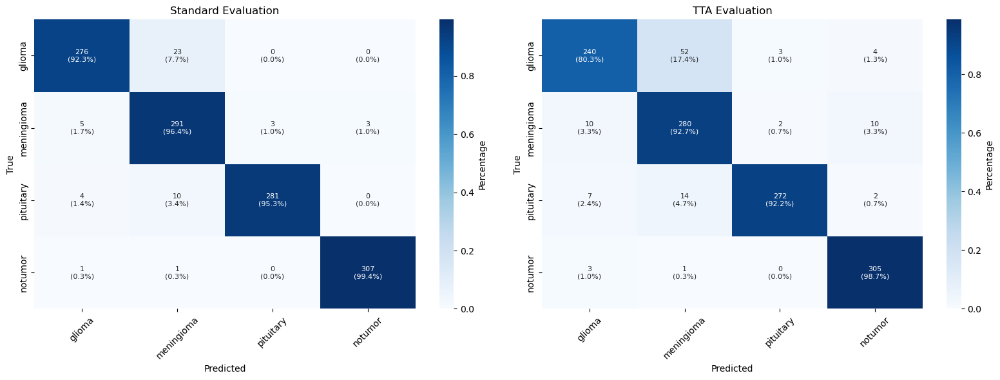


DETAILED CLASSIFICATION REPORT
              precision    recall  f1-score   support

      glioma     0.9231    0.8027    0.8587       299
  meningioma     0.8069    0.9272    0.8629       302
   pituitary     0.9819    0.9220    0.9510       295
     notumor     0.9502    0.9871    0.9683       309

    accuracy                         0.9104      1205
   macro avg     0.9155    0.9097    0.9102      1205
weighted avg     0.9153    0.9104    0.9104      1205


CLASS-WISE PERFORMANCE SUMMARY
Class                Precision  Recall     F1-Score   Support   
------------------------------------------------------------
glioma               0.9231     0.8027     0.8587     299       
meningioma           0.8069     0.9272     0.8629     302       
pituitary            0.9819     0.9220     0.9510     295       
notumor              0.9502     0.9871     0.9683     309       

PERFORMANCE COMPARISON (Standard vs TTA)
Metric       Standard   TTA        Difference
------------ ---------- ---

In [12]:
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, precision_score, recall_score, f1_score
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf

# Helper: Plot confusion matrix in a subplot
def plot_cm_subplot(ax, cm, labels, title):
    cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
    annotations = np.empty_like(cm).astype(str)

    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            count = cm[i, j]
            percent = cm_normalized[i, j] * 100
            annotations[i, j] = f"{count}\n({percent:.1f}%)"

    sns.heatmap(
        cm_normalized,
        annot=annotations,
        fmt='',
        cmap='Blues',
        ax=ax,
        xticklabels=[label[:12] for label in labels],
        yticklabels=[label[:12] for label in labels],
        cbar_kws={'label': 'Percentage'},
        annot_kws={"size": 8}
    )
    ax.set_title(title, fontsize=12)
    ax.set_xlabel('Predicted', fontsize=10)
    ax.set_ylabel('True', fontsize=10)
    ax.tick_params(axis='x', rotation=45)

# ===============================================
# 1. Standard Evaluation
# ===============================================
print("\n" + "="*50)
print("STANDARD EVALUATION (NO TEST-TIME AUGMENTATION)")
print("="*50)

test_loss, test_accuracy, test_precision, test_recall, test_auc = my_model.evaluate(
    X_test, Y_test, verbose=0
)

print(f"\nTest Loss     : {test_loss:.4f}")
print(f"Test Accuracy : {test_accuracy*100:.2f}%")
print(f"Test Precision: {test_precision:.4f}")
print(f"Test Recall   : {test_recall:.4f}")
print(f"Test AUC      : {test_auc:.4f}")
print("-"*50)

# Predictions
y_pred_std = np.argmax(my_model.predict(X_test, verbose=0), axis=1)
y_true = np.argmax(Y_test, axis=1)
cm_std = confusion_matrix(y_true, y_pred_std)

# ===============================================
# 2. TTA Evaluation
# ===============================================
print("\n" + "="*50)
print("TEST-TIME AUGMENTATION (TTA) EVALUATION")
print("="*50)

def predict_with_tta_batched(model, X, batch_size=32, n=5):
    y_pred_tta = []
    num_batches = int(np.ceil(len(X) / batch_size))

    for batch_idx in range(num_batches):
        start_idx = batch_idx * batch_size
        end_idx = min((batch_idx + 1) * batch_size, len(X))
        batch = X[start_idx:end_idx]

        batch_predictions = []
        for _ in range(n):
            aug = tf.image.random_flip_left_right(batch)
            aug = tf.image.random_flip_up_down(aug)
            aug = tf.image.rot90(aug, k=np.random.randint(0, 4))
            pred = model.predict(aug, verbose=0)
            batch_predictions.append(pred)

        batch_avg = np.mean(batch_predictions, axis=0)
        y_pred_tta.append(batch_avg)

    return np.concatenate(y_pred_tta, axis=0)

print("\nEvaluating with Batched Test-Time Augmentation...")
y_pred_tta = predict_with_tta_batched(my_model, X_test, batch_size=32, n=5)
y_pred_classes = np.argmax(y_pred_tta, axis=1)

# TTA metrics
accuracy = accuracy_score(y_true, y_pred_classes)
precision = precision_score(y_true, y_pred_classes, average='weighted')
recall = recall_score(y_true, y_pred_classes, average='weighted')
f1 = f1_score(y_true, y_pred_classes, average='weighted')

print(f"\nTTA Performance:")
print(f"Accuracy : {accuracy:.4f} ({accuracy*100:.2f}%)")
print(f"Precision: {precision:.4f}")
print(f"Recall   : {recall:.4f}")
print(f"F1-Score : {f1:.4f}")
print("-"*50)

# Confusion Matrix (TTA)
cm_tta = confusion_matrix(y_true, y_pred_classes)

# ===============================================
# Side-by-Side Confusion Matrices
# ===============================================
fig, axs = plt.subplots(1, 2, figsize=(16, 6))
plot_cm_subplot(axs[0], cm_std, LABELS, title='Standard Evaluation')
plot_cm_subplot(axs[1], cm_tta, LABELS, title='TTA Evaluation')
plt.tight_layout()
plt.show()

# ===============================================
# 3. Classification Report
# ===============================================
print("\n" + "="*50)
print("DETAILED CLASSIFICATION REPORT")
print("="*50)
print(classification_report(y_true, y_pred_classes, target_names=LABELS, digits=4))

# ===============================================
# 4. Class-wise Performance Breakdown
# ===============================================
print("\n" + "="*50)
print("CLASS-WISE PERFORMANCE SUMMARY")
print("="*50)

precision_per_class = precision_score(y_true, y_pred_classes, average=None)
recall_per_class = recall_score(y_true, y_pred_classes, average=None)
f1_per_class = f1_score(y_true, y_pred_classes, average=None)

print(f"{'Class':<20} {'Precision':<10} {'Recall':<10} {'F1-Score':<10} {'Support':<10}")
print("-" * 60)
for i, label in enumerate(LABELS):
    support = np.sum(y_true == i)
    print(f"{label:<20} {precision_per_class[i]:<10.4f} {recall_per_class[i]:<10.4f} {f1_per_class[i]:<10.4f} {support:<10}")

# ===============================================
# 5. Performance Comparison
# ===============================================
print("\n" + "="*50)
print("PERFORMANCE COMPARISON (Standard vs TTA)")
print("="*50)
print(f"{'Metric':<12} {'Standard':<10} {'TTA':<10} {'Difference':<10}")
print(f"{'-'*12} {'-'*10} {'-'*10} {'-'*10}")
print(f"{'Accuracy':<12} {test_accuracy:.4f}    {accuracy:.4f}    {accuracy - test_accuracy:+.4f}")
print(f"{'Precision':<12} {test_precision:.4f}    {precision:.4f}    {precision - test_precision:+.4f}")
print(f"{'Recall':<12} {test_recall:.4f}    {recall:.4f}    {recall - test_recall:+.4f}")

# ===============================================
# 6. Error Analysis
# ===============================================
print("\n" + "="*50)
print("TOP ERROR ANALYSIS")
print("="*50)

for i, label in enumerate(LABELS):
    misclassified = np.where((y_pred_classes != y_true) & (y_true == i))[0]
    if len(misclassified) > 0:
        wrong_preds = y_pred_classes[misclassified]
        top_error = np.bincount(wrong_preds).argmax()
        error_count = np.sum(wrong_preds == top_error)
        print(f"{label} -> {LABELS[top_error]}: {error_count}/{len(misclassified)} errors")



PHASE 1: INITIAL TRAINING METRICS


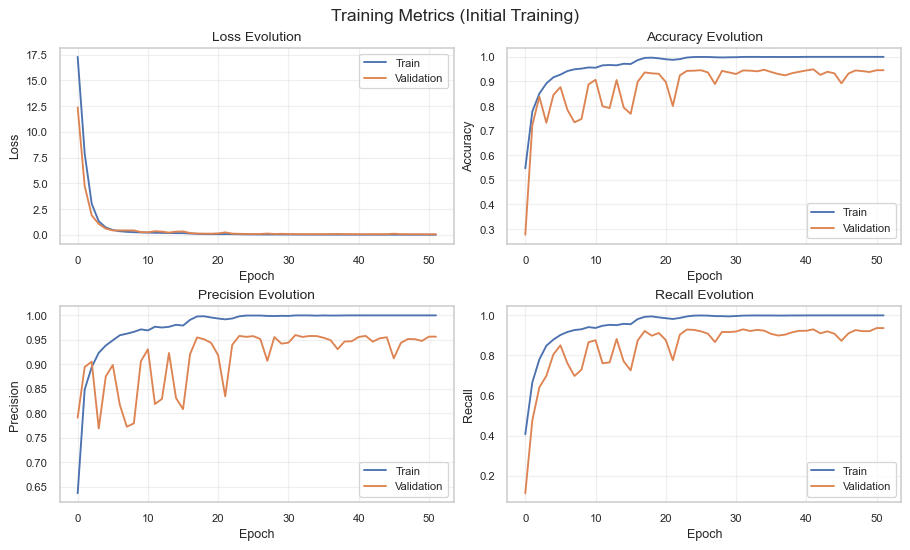


PHASE 2: FINE-TUNING METRICS


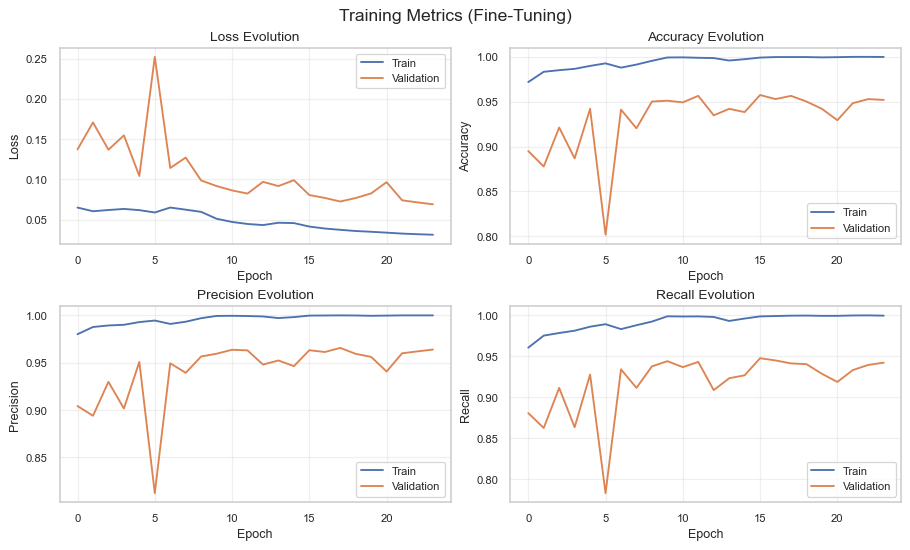

In [13]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import tensorflow as tf
from sklearn.metrics import (
    confusion_matrix, classification_report, 
    accuracy_score, precision_score, recall_score, 
    f1_score, precision_recall_fscore_support,
    roc_curve, auc, precision_recall_curve
)
from sklearn.preprocessing import label_binarize

# Global styling
sns.set(style='whitegrid', font_scale=1.05)
plt.rcParams.update({
    'figure.dpi': 90,
    'axes.titlesize': 11,
    'axes.labelsize': 10,
    'legend.fontsize': 9,
    'xtick.labelsize': 9,
    'ytick.labelsize': 9
})

# ==============================================================================
# 1. TRAINING HISTORY VISUALIZATION
# ==============================================================================
def plot_training_history(history, title_suffix=""):
    """Compact training curve display."""
    fig, axs = plt.subplots(2, 2, figsize=(10, 6), constrained_layout=True)
    fig.suptitle(f'Training Metrics {title_suffix}', fontsize=14)

    metrics = {
        'Loss': ('loss', 'val_loss'),
        'Accuracy': ('accuracy', 'val_accuracy'),
        'Precision': ('precision', 'val_precision'),
        'Recall': ('recall', 'val_recall')
    }

    for ax, (title, (train_key, val_key)) in zip(axs.flat, metrics.items()):
        ax.plot(history.history.get(train_key, []), label='Train', lw=1.5)
        ax.plot(history.history.get(val_key, []), label='Validation', lw=1.5)
        ax.set_title(f'{title} Evolution')
        ax.set_xlabel('Epoch')
        ax.set_ylabel(title)
        ax.grid(True, alpha=0.3)
        ax.legend()

    return fig

# ==============================================================================
# 2. DISPLAY TRAINING HISTORY
# ==============================================================================
print("\n" + "="*60)
print("PHASE 1: INITIAL TRAINING METRICS")
print("="*60)
plot_training_history(history, "(Initial Training)")
plt.show()

print("\n" + "="*60)
print("PHASE 2: FINE-TUNING METRICS")
print("="*60)
plot_training_history(history_fine, "(Fine-Tuning)")
plt.show()

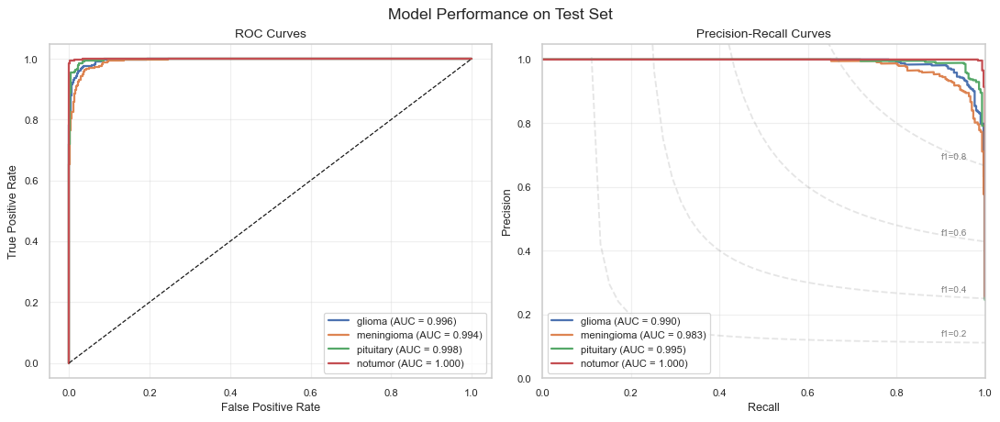

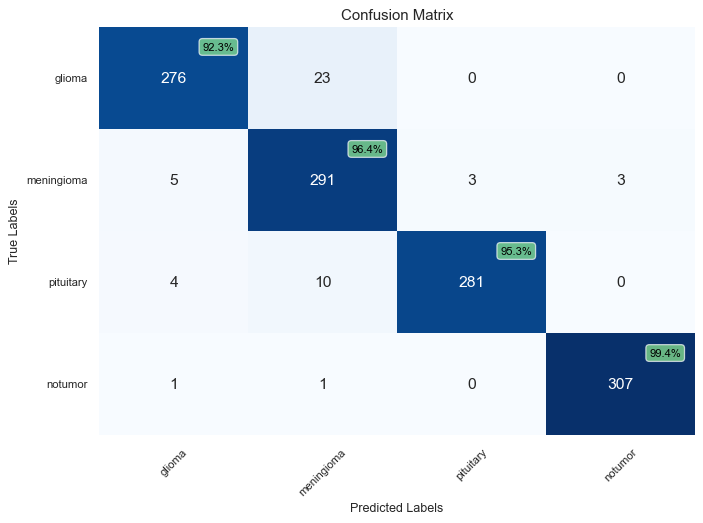


DETAILED CLASSIFICATION REPORT
              precision    recall  f1-score   support

      glioma       0.97      0.92      0.94       299
  meningioma       0.90      0.96      0.93       302
   pituitary       0.99      0.95      0.97       295
     notumor       0.99      0.99      0.99       309

    accuracy                           0.96      1205
   macro avg       0.96      0.96      0.96      1205
weighted avg       0.96      0.96      0.96      1205


TOP MISCLASSIFICATION PATTERNS
glioma -> meningioma: 23 errors
pituitary -> meningioma: 10 errors
meningioma -> glioma: 5 errors
pituitary -> glioma: 4 errors
meningioma -> notumor: 3 errors


In [14]:
# First, compute predictions and true labels
y_pred = my_model.predict(X_test, verbose=0)
y_true = np.argmax(Y_test, axis=1)  # Convert one-hot to class indices

# Now proceed with the visualization code
n_classes = len(LABELS)
y_test_bin = label_binarize(y_true, classes=range(n_classes))

# Create subplots
fig, axs = plt.subplots(1, 2, figsize=(12, 5), constrained_layout=True)

# ROC Curve
for i in range(n_classes):
    fpr, tpr, _ = roc_curve(y_test_bin[:, i], y_pred[:, i])
    roc_auc = auc(fpr, tpr)
    axs[0].plot(fpr, tpr, lw=1.8, label=f'{LABELS[i]} (AUC = {roc_auc:.3f})')

axs[0].plot([0, 1], [0, 1], 'k--', lw=1)
axs[0].set_title('ROC Curves')
axs[0].set_xlabel('False Positive Rate')
axs[0].set_ylabel('True Positive Rate')
axs[0].legend(loc='lower right')
axs[0].grid(alpha=0.3)

# PR Curve
for i in range(n_classes):
    precision_curve, recall_curve, _ = precision_recall_curve(y_test_bin[:, i], y_pred[:, i])
    pr_auc = auc(recall_curve, precision_curve)
    axs[1].plot(recall_curve, precision_curve, lw=1.8, label=f'{LABELS[i]} (AUC = {pr_auc:.3f})')

# Add iso-f1 curves
f_scores = np.linspace(0.2, 0.8, num=4)
for f_score in f_scores:
    x = np.linspace(0.01, 1)
    y = f_score * x / (2 * x - f_score)
    axs[1].plot(x[y >= 0], y[y >= 0], color='gray', alpha=0.2, linestyle='--')
    axs[1].annotate(f"f1={f_score:.1f}", xy=(0.9, y[-1] + 0.02), fontsize=8, alpha=0.6)

axs[1].set_title('Precision-Recall Curves')
axs[1].set_xlabel('Recall')
axs[1].set_ylabel('Precision')
axs[1].legend(loc='lower left')
axs[1].set_ylim([0.0, 1.05])
axs[1].set_xlim([0.0, 1.0])
axs[1].grid(alpha=0.3)

plt.suptitle('Model Performance on Test Set', fontsize=14)
plt.show()

# ==============================================================================
# 4. CONFUSION MATRIX VISUALIZATION
# ==============================================================================
y_pred_classes = np.argmax(y_pred, axis=1)
cm = confusion_matrix(y_true, y_pred_classes)

plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
            xticklabels=LABELS, 
            yticklabels=LABELS,
            cbar=False)

plt.title('Confusion Matrix', fontsize=12)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.xticks(rotation=45)
plt.yticks(rotation=0)

# Add accuracy annotations
for i in range(len(LABELS)):
    accuracy = cm[i,i] / cm[i].sum()
    plt.text(i+0.8, i+0.2, f'{accuracy:.1%}', 
             ha='center', va='center', 
             color='black' if accuracy > 0.5 else 'white',
             fontsize=9,
             bbox=dict(boxstyle='round,pad=0.3', 
                       facecolor=('white' if accuracy < 0.7 else 'lightgreen'), 
                       alpha=0.7))

plt.tight_layout()
plt.show()

# ==============================================================================
# 5. CLASSIFICATION REPORT
# ==============================================================================
print("\n" + "="*60)
print("DETAILED CLASSIFICATION REPORT")
print("="*60)
print(classification_report(y_true, y_pred_classes, target_names=LABELS))

# ==============================================================================
# 6. ERROR ANALYSIS - TOP MISCLASSIFICATIONS
# ==============================================================================
error_indices = np.where(y_true != y_pred_classes)[0]
error_samples = []
for idx in error_indices:
    true_label = LABELS[y_true[idx]]
    pred_label = LABELS[y_pred_classes[idx]]
    error_samples.append((true_label, pred_label, idx))

error_counts = {}
for true, pred, _ in error_samples:
    key = f"{true} -> {pred}"
    error_counts[key] = error_counts.get(key, 0) + 1

# Sort by frequency
sorted_errors = sorted(error_counts.items(), key=lambda x: x[1], reverse=True)[:5]

print("\n" + "="*60)
print("TOP MISCLASSIFICATION PATTERNS")
print("="*60)
for pattern, count in sorted_errors:
    print(f"{pattern}: {count} errors")

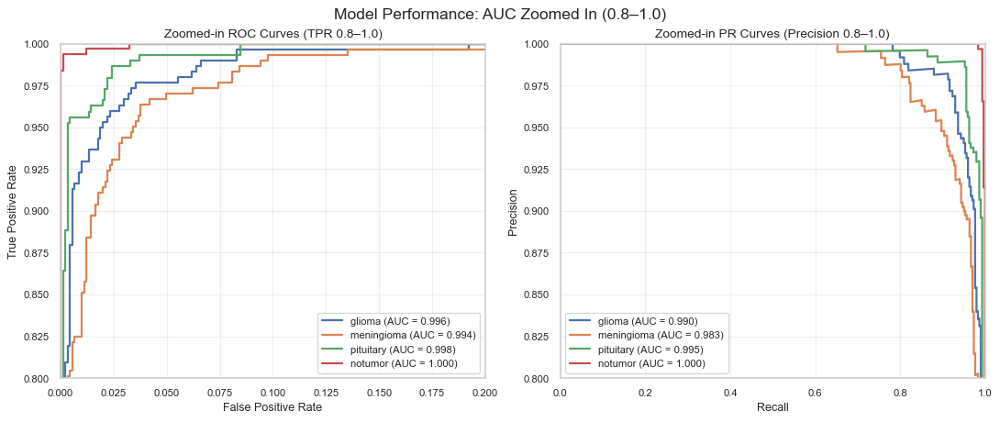

In [15]:
# ==============================================================================
# ZOOMED-IN ROC AND PR CURVES (AUC between 0.8 and 1.0)
# ==============================================================================

fig, axs = plt.subplots(1, 2, figsize=(12, 5), constrained_layout=True)

# Zoomed-in ROC Curve
for i in range(n_classes):
    fpr, tpr, _ = roc_curve(y_test_bin[:, i], y_pred[:, i])
    roc_auc = auc(fpr, tpr)
    axs[0].plot(fpr, tpr, lw=1.8, label=f'{LABELS[i]} (AUC = {roc_auc:.3f})')

axs[0].plot([0, 1], [0, 1], 'k--', lw=1)
axs[0].set_xlim([0.0, 0.2])   # Focus on low FPR
axs[0].set_ylim([0.8, 1.0])   # Focus on high TPR
axs[0].set_title('Zoomed-in ROC Curves (TPR 0.8–1.0)')
axs[0].set_xlabel('False Positive Rate')
axs[0].set_ylabel('True Positive Rate')
axs[0].legend(loc='lower right')
axs[0].grid(alpha=0.3)

# Zoomed-in PR Curve
for i in range(n_classes):
    precision_curve, recall_curve, _ = precision_recall_curve(y_test_bin[:, i], y_pred[:, i])
    pr_auc = auc(recall_curve, precision_curve)
    axs[1].plot(recall_curve, precision_curve, lw=1.8, label=f'{LABELS[i]} (AUC = {pr_auc:.3f})')

axs[1].set_xlim([0.0, 1.0])
axs[1].set_ylim([0.8, 1.0])   # Focus on high precisionS
axs[1].set_title('Zoomed-in PR Curves (Precision 0.8–1.0)')
axs[1].set_xlabel('Recall')
axs[1].set_ylabel('Precision')
axs[1].legend(loc='lower left')
axs[1].grid(alpha=0.3)

plt.suptitle('Model Performance: AUC Zoomed In (0.8–1.0)', fontsize=14)
plt.show()


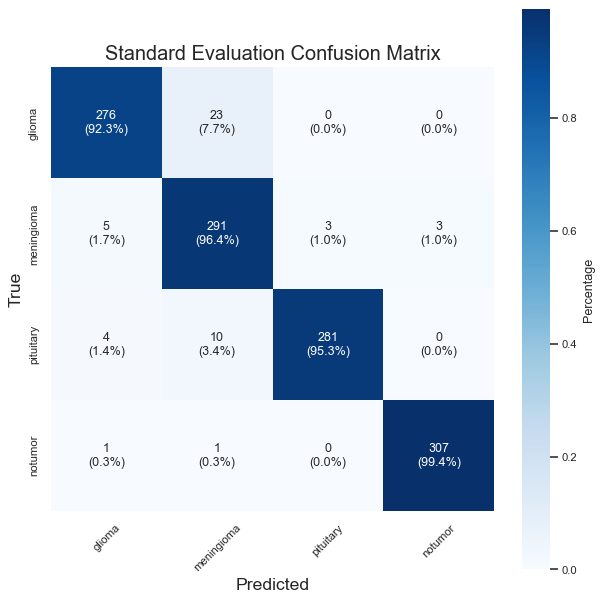

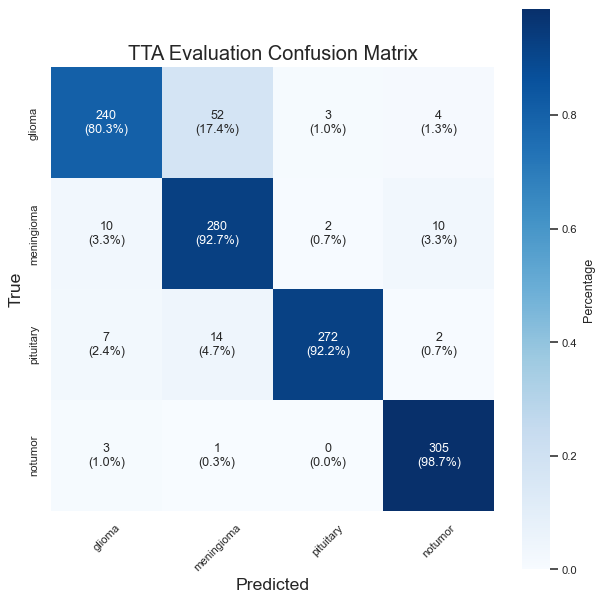

In [16]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

def plot_cm_subplot(ax, cm, labels, title):
    cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
    annotations = np.empty_like(cm).astype(str)

    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            count = cm[i, j]
            percent = cm_normalized[i, j] * 100
            annotations[i, j] = f"{count}\n({percent:.1f}%)"

    sns.heatmap(
        cm_normalized,
        annot=annotations,
        fmt='',
        cmap='Blues',
        ax=ax,
        xticklabels=[label[:12] for label in labels],
        yticklabels=[label[:12] for label in labels],
        cbar_kws={'label': 'Percentage'},
        annot_kws={"size": 10},
        square=True  # <-- keep cells square
    )
    ax.set_title(title, fontsize=16)
    ax.set_xlabel('Predicted', fontsize=14)
    ax.set_ylabel('True', fontsize=14)
    ax.tick_params(axis='x', rotation=45)

# Plot confusion matrix with square cells and reasonable size
fig, ax = plt.subplots(figsize=(7, 7))
plot_cm_subplot(ax, cm_std, LABELS, title='Standard Evaluation Confusion Matrix')
plt.tight_layout()
plt.show()

# Plot TTA confusion matrix with the same style
fig, ax = plt.subplots(figsize=(7, 7))
plot_cm_subplot(ax, cm_tta, LABELS, title='TTA Evaluation Confusion Matrix')
plt.tight_layout()
plt.show()



Generating Grad-CAM visualizations...


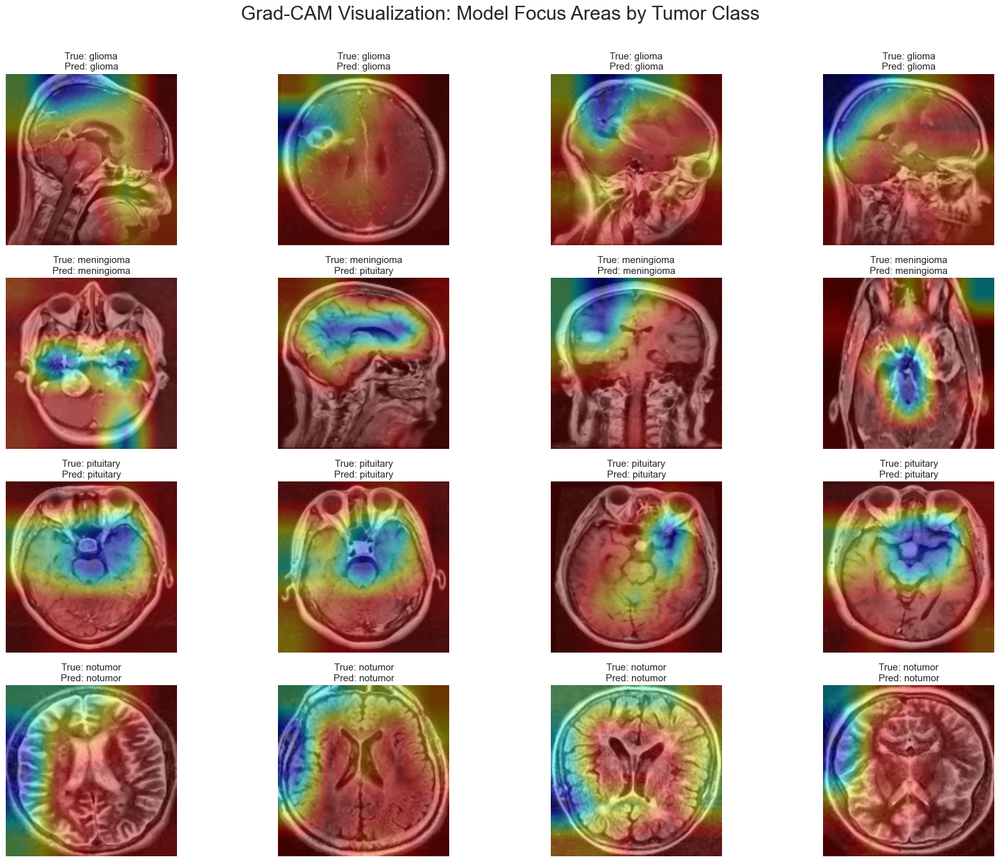

In [17]:
def generate_grad_cam(model, img_array, layer_name, class_idx=None, eps=1e-8):
    """Generate Grad-CAM heatmap for a given image"""
    grad_model = tf.keras.models.Model(
        inputs=[model.inputs],
        outputs=[model.get_layer(layer_name).output, model.output]
    )
    
    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        if class_idx is None:
            class_idx = np.argmax(predictions[0])
        loss = predictions[:, class_idx]
    
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    
    conv_outputs = conv_outputs[0]
    heatmap = conv_outputs @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)
    heatmap = tf.maximum(heatmap, 0) / (tf.math.reduce_max(heatmap) + eps)
    
    return heatmap.numpy(), class_idx

def plot_grad_cam_grid(model, images, labels, true_labels, layer_name='Conv5', num_samples=4):
    """Plot Grad-CAM heatmaps for multiple classes in a grid layout"""
    plt.figure(figsize=(20, 15))
    plt.suptitle("Grad-CAM Visualization: Model Focus Areas by Tumor Class", fontsize=24, y=1)
    
    for class_idx, class_name in enumerate(LABELS):
        # Get samples of current class
        class_indices = np.where(np.argmax(true_labels, axis=1) == class_idx)[0]
        sample_indices = np.random.choice(class_indices, num_samples, replace=False)
        
        for j, idx in enumerate(sample_indices):
            img = images[idx]
            true_class = LABELS[np.argmax(true_labels[idx])]
            
            # Generate heatmap
            heatmap, pred_class_idx = generate_grad_cam(model, np.expand_dims(img, axis=0), layer_name)
            pred_class = LABELS[pred_class_idx]
            
            # Upsample heatmap
            heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
            heatmap = np.uint8(255 * heatmap)
            heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
            
            # Superimpose heatmap on image
            img_rgb = cv2.cvtColor(np.uint8(255 * img[..., 0]), cv2.COLOR_GRAY2RGB)
            superimposed_img = cv2.addWeighted(img_rgb, 0.6, heatmap, 0.4, 0)
            
            # Plot
            ax = plt.subplot(len(LABELS), num_samples, class_idx * num_samples + j + 1)
            plt.imshow(superimposed_img)
            plt.title(f"True: {true_class}\nPred: {pred_class}", fontsize=12)
            plt.axis('off')
    
    plt.tight_layout()
    plt.subplots_adjust(top=0.92)
    plt.show()

# Generate Grad-CAM visualizations
print("\nGenerating Grad-CAM visualizations...")
plot_grad_cam_grid(my_model, X_test, Y_test, Y_test, layer_name='Conv5', num_samples=4)


Visualizing feature space with t-SNE...


C:\Users\Shafi.09\anaconda3\envs\tensorflow\lib\site-packages\sklearn\manifold\_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
C:\Users\Shafi.09\anaconda3\envs\tensorflow\lib\site-packages\sklearn\manifold\_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(
C:\Users\Shafi.09\AppData\Local\Temp\ipykernel_26412\2446774867.py:22: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap=plt.cm.get_cmap('viridis', len(LABELS)),


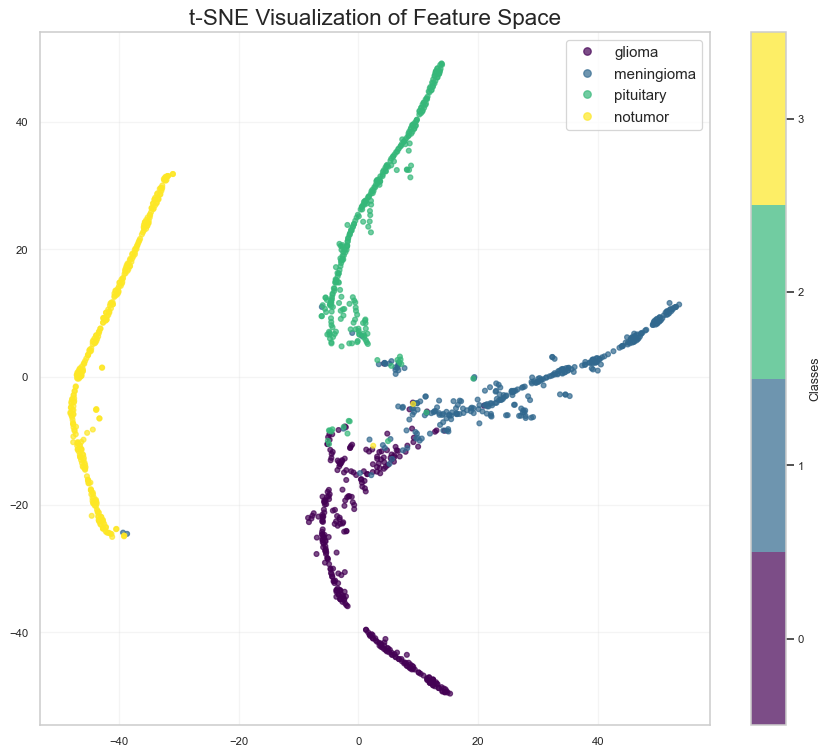

In [18]:
from sklearn.manifold import TSNE

def visualize_feature_space(model, images, labels, perplexity=30):
    """Visualize feature space using t-SNE"""
    # Extract features from the layer before the final classification
    feature_model = tf.keras.Model(
        inputs=model.input,
        outputs=model.get_layer('Dense3').output
    )
    
    # Get features
    features = feature_model.predict(images, verbose=0)
    
    # Apply t-SNE
    tsne = TSNE(n_components=2, perplexity=perplexity, random_state=RANDOM_STATE)
    features_2d = tsne.fit_transform(features)
    
    # Plot
    plt.figure(figsize=(12, 10))
    scatter = plt.scatter(features_2d[:, 0], features_2d[:, 1], 
                          c=np.argmax(labels, axis=1), 
                          cmap=plt.cm.get_cmap('viridis', len(LABELS)),
                          alpha=0.7, s=15)
    
    plt.title('t-SNE Visualization of Feature Space', fontsize=18)
    plt.colorbar(scatter, ticks=range(len(LABELS)), label='Classes')
    plt.clim(-0.5, len(LABELS)-0.5)
    plt.legend(handles=scatter.legend_elements()[0], labels=LABELS, fontsize=12)
    plt.grid(alpha=0.2)
    plt.show()

# Visualize feature space
print("\nVisualizing feature space with t-SNE...")
visualize_feature_space(my_model, X_test, Y_test)


Generating activation maximization for glioma...


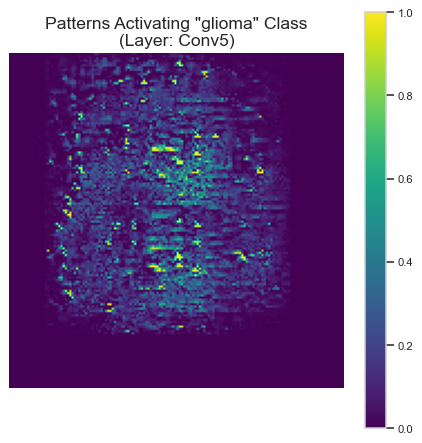


Generating activation maximization for meningioma...


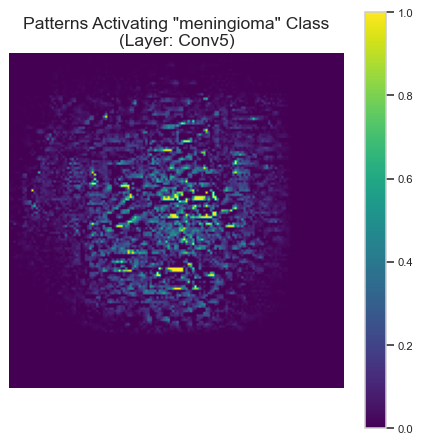


Generating activation maximization for pituitary...


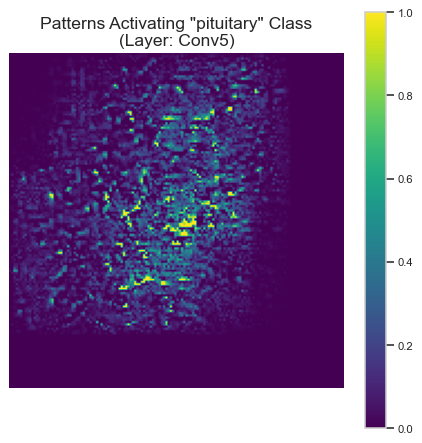


Generating activation maximization for notumor...


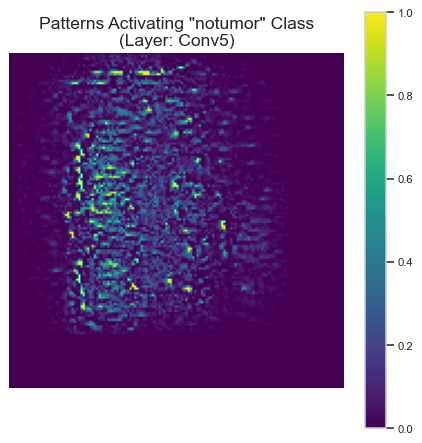

In [19]:
def plot_activation_maximization(model, target_class, layer_name='Conv1', steps=100, lr=0.1):
    """Visualize what patterns activate a specific class"""
    # Find output index for target class
    output_idx = LABELS.index(target_class)
    
    # Create model that outputs the target layer and final predictions
    sub_model = tf.keras.Model(
        inputs=model.input,
        outputs=[model.get_layer(layer_name).output, model.output]
    )
    
    # Initialize random image
    img = tf.random.uniform((1, IMAGE_SIZE, IMAGE_SIZE, 1), minval=0.1, maxval=0.9)
    
    # Optimization loop
    for _ in range(steps):
        with tf.GradientTape() as tape:
            tape.watch(img)
            layer_output, predictions = sub_model(img)
            loss = predictions[0, output_idx] - 1e-3 * tf.reduce_mean(img**2)
        
        grads = tape.gradient(loss, img)
        grads /= tf.math.reduce_std(grads) + 1e-8
        img += lr * grads
        img = tf.clip_by_value(img, 0, 1)
    
    # Plot
    plt.figure(figsize=(6, 6))
    plt.imshow(img[0, :, :, 0], cmap='viridis')
    plt.title(f'Patterns Activating "{target_class}" Class\n(Layer: {layer_name})', fontsize=14)
    plt.axis('off')
    plt.colorbar()
    plt.show()

# Generate for each class
for class_name in LABELS:
    print(f"\nGenerating activation maximization for {class_name}...")
    plot_activation_maximization(my_model, class_name, layer_name='Conv5')

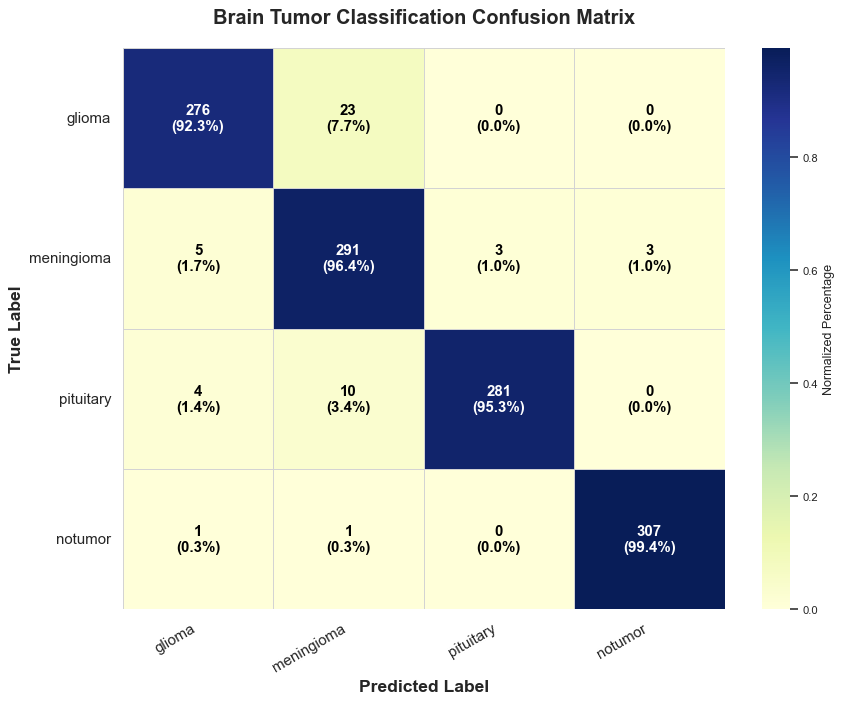

In [25]:
def plot_publication_confusion_matrix(cm, class_names, title='Confusion Matrix'):
    plt.figure(figsize=(10, 8))
    cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
    
    # Create annotations with count and percentage
    annotations = np.empty_like(cm).astype(str)
    text_colors = np.empty_like(cm).astype(str)  # To store optimal text colors
    
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            count = cm[i, j]
            percent = cm_normalized[i, j] * 100
            annotations[i, j] = f"{count}\n({percent:.1f}%)"
            
            # Determine optimal text color based on background brightness
            # Use white text for dark backgrounds, black for light backgrounds
            text_colors[i, j] = 'white' if cm_normalized[i, j] > 0.5 else 'black'
    
    # Create heatmap with custom annotations and text colors
    heatmap = sns.heatmap(
        cm_normalized,
        annot=annotations,
        fmt='',
        cmap='YlGnBu',  # Lighter, more readable colormap
        cbar_kws={'label': 'Normalized Percentage'},
        linewidths=0.5,
        linecolor='lightgray',
        annot_kws={
            "size": 12, 
            "weight": "bold",
            "color": "black"  # We'll override this per cell below
        }
    )
    
    # Manually set text colors for each cell
    for i, text_row in enumerate(heatmap.texts):
        row = i // cm.shape[1]
        col = i % cm.shape[1]
        text_row.set_color(text_colors[row][col])
    
    # Customize plot appearance
    plt.title(title, fontsize=16, fontweight='bold', pad=20)
    plt.xlabel('Predicted Label', fontsize=14, fontweight='bold')
    plt.ylabel('True Label', fontsize=14, fontweight='bold')
    
    # Shorten long labels for better display
    short_labels = [label[:15] for label in class_names]
    
    # Set tick labels with rotation
    plt.xticks(
        ticks=np.arange(len(short_labels)) + 0.5,
        labels=short_labels,
        rotation=30,
        ha='right',
        fontsize=12
    )
    plt.yticks(
        ticks=np.arange(len(short_labels)) + 0.5,
        labels=short_labels,
        rotation=0,
        fontsize=12
    )
    
    
    plt.tight_layout()
    plt.show()

# Generate the publication-quality confusion matrix
plot_publication_confusion_matrix(cm_std, LABELS, title='Brain Tumor Classification Confusion Matrix')

In [23]:
my_model.save(f"../models/presys")

INFO:tensorflow:Assets written to: ../models/1sys\assets


INFO:tensorflow:Assets written to: ../models/1sys\assets
